# (sFigure16)-The Marker Genes Distribution Across Sub Cell Types of Epithelial Cells at Single Cell Resolution.

In [15]:
import anndata as ad
import scanpy as sc
import omicverse as ov

In [16]:
# 字体设置
import os
from matplotlib import rcParams
from matplotlib.font_manager import FontProperties

font_path = 'Gastric/Arial.ttf'
front_prop = FontProperties(fname=font_path)

#绘图参数设置
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white')

In [17]:
Epi = sc.read_h5ad('Gastric/Data/Epi_anno.h5ad')
Epi

AnnData object with n_obs × n_vars = 26265 × 2000
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person', 'Epi_celltype'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Group_number_colors', 'Person_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_Epi_celltype', 'dendrogram_Group_number', 'dendrogram_leiden', 'dendrogram_major_celltype', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'major_celltype_colors', 'neighbors', 'paga', 'pca', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [18]:
Epi.uns['Epi_celltype_colors'] = [ov.pl.blue_color[2],ov.pl.blue_color[3],ov.pl.red_color[4],ov.pl.blue_color[5],
                                  ov.pl.red_color[0],ov.pl.red_color[2],ov.pl.red_color[1]]

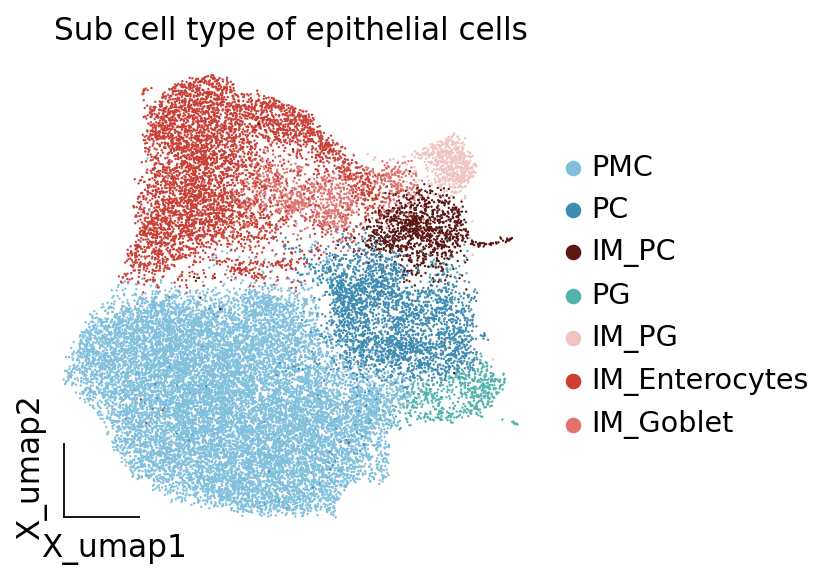

In [19]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots( figsize = (4,4))
ax = ov.utils.embedding(Epi,
                basis='X_umap',
                color=['Epi_celltype'],
                title='Sub cell type of epithelial cells',
                frameon='small',
                show=False,
                ax=ax)

plt.savefig("Gastric/Figure/sFigure16/sFigure16_A.png",dpi=300,bbox_inches = 'tight')

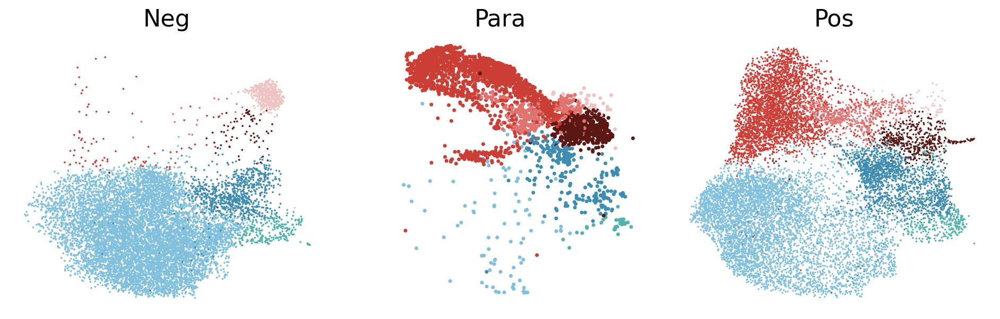

In [20]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4), sharex=True, sharey=True)

for j, ax in enumerate(axes):
    axes = ov.utils.embedding(Epi[Epi.obs['Sample']==sorted(list(set(Epi.obs['Sample'])))[j]],
                               basis='X_umap',
                               color=['Epi_celltype'],
                               title=sorted(list(set(Epi.obs['Sample'])))[j],
                               frameon=False,
                               show=False,
                               legend_loc=False,
                               ax=ax)
    axes.set_title(sorted(list(set(Epi.obs['Sample'])))[j],fontdict={'size':20})

plt.tight_layout()

plt.savefig('Gastric/Figure/sFigure16/sFigure16_B.png', dpi=300)

plt.show()


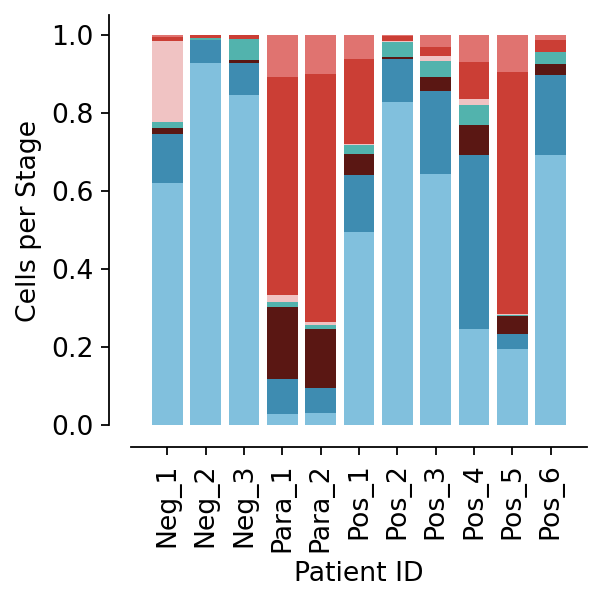

In [21]:
ax = ov.utils.plot_cellproportion(adata=Epi,celltype_clusters='Epi_celltype',
                    visual_clusters='Person',
                    visual_name='Patient ID',figsize=(4,4))
plt.savefig("Gastric/Figure/sFigure16/sFigure16_C.png",dpi=300,bbox_inches = 'tight')

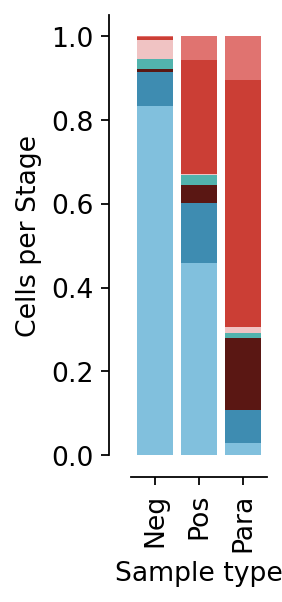

In [22]:
ax = ov.utils.plot_cellproportion(adata=Epi,celltype_clusters='Epi_celltype',
                    visual_clusters='Sample',
                    visual_name='Sample type',figsize=(2,4))
plt.savefig("Gastric/Figure/sFigure16/sFigure16_D.png",dpi=300,bbox_inches = 'tight')

In [23]:

marker_genes_dict = {
    'PMC':['GKN1','GKN2','MUC5AC','TFF1'],
    'PC':['MKI67','HMGB2','STMN1'],
    'PG':['MUC6','PGC'],
    'Enterocytes':['FABP1','FABP2','CDH17','CLDN7','CLDN4',],
    'Goblet':['MUC2','ITLN1','TFF3','SPINK4'],
    'IM_Marker':['REG4','CDX1','CDX2'],

}

all_genes = [gene for gene_list in marker_genes_dict.values() for gene in gene_list]
len(all_genes)

21

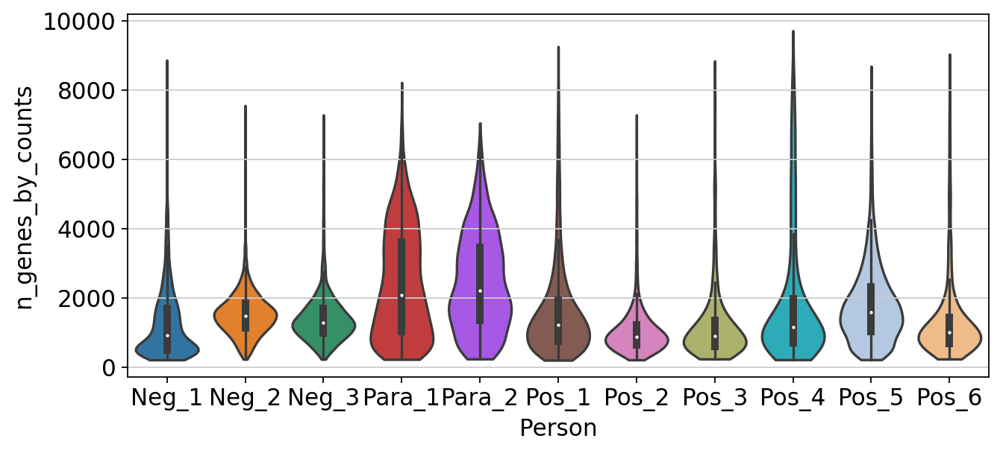

In [24]:
from matplotlib.pyplot import rc_context

with rc_context({'figure.figsize': (8, 4)}):
    sc.pl.violin(Epi, ['n_genes_by_counts'], groupby='Person', stripplot=False, inner='box',show=False)
plt.savefig('Gastric/Figure/sFigure16/sFigure16_E.png', dpi=300,bbox_inches = 'tight')


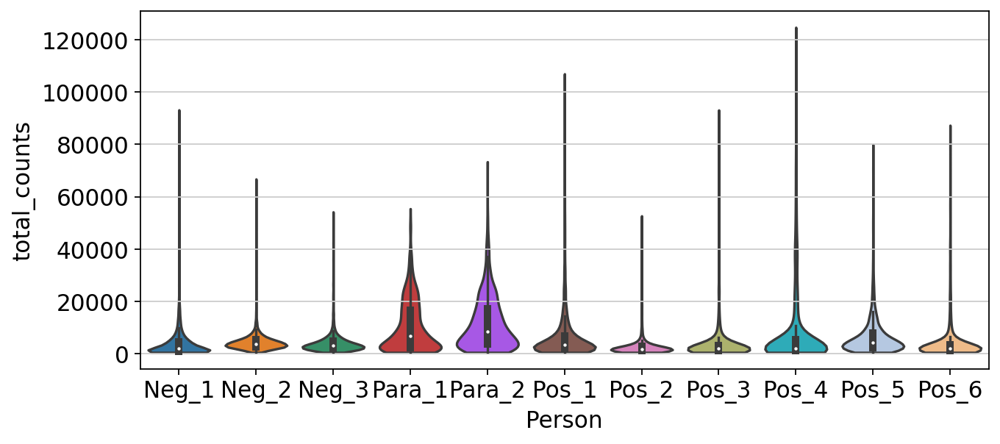

In [25]:
from matplotlib.pyplot import rc_context

with rc_context({'figure.figsize': (8, 4)}):
    sc.pl.violin(Epi, ['total_counts'], groupby='Person', stripplot=False, inner='box',show=False)
plt.savefig('Gastric/Figure/sFigure16/sFigure16_F.png', dpi=300,bbox_inches = 'tight')


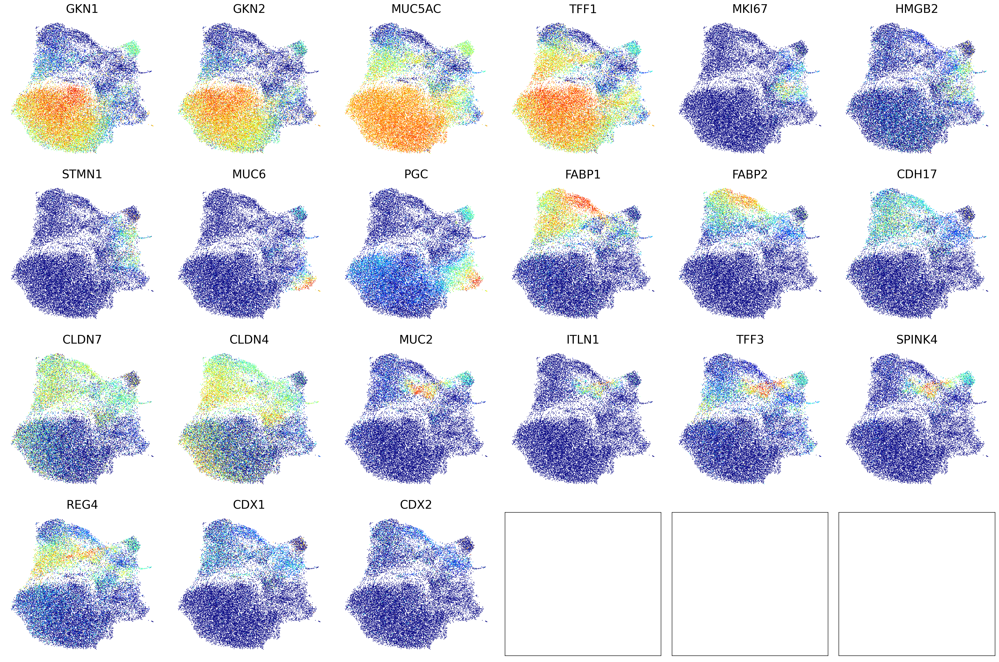

In [26]:
import matplotlib.pyplot as plt
import matplotlib as mpl
fig, axes = plt.subplots(nrows=4, ncols=6, figsize=(24, 16), sharex=True, sharey=True)

for i, row_axes in enumerate(axes):
    for j, ax in enumerate(row_axes):
        if i * 6 + j < 21:
            axes = ov.utils.embedding(Epi,
                               basis='X_umap',
                               color=all_genes[i * 6 + j],
                               title=all_genes[i * 6 + j],
                               frameon=False,
                               show=False,
                               legend_loc=False,
                               color_map = mpl.cm.get_cmap('jet'),
                               colorbar_loc=None,
                               legend_fontsize=18,
                               ax=ax)
            axes.set_title(all_genes[i * 6 + j],fontdict={'size':20})

plt.tight_layout()
plt.savefig('Gastric/Figure/sFigure16/sFigure16_G.png', dpi=300)
plt.show()


# 